In [8]:
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go
from matplotlib import pyplot as plt
import pandas as pd
import csv
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, RepeatVector, TimeDistributed
import tensorflow as tf
import numpy as np

np.random.seed(1)
tf.random.set_seed(1)
print('Tensorflow version: ', tf.__version__)

Tensorflow version:  2.11.0


In [72]:
df = pd.read_csv("event_log.csv")
df

,ds,y
0,1/1/2018 0:15,0
1,1/1/2018 0:30,0
2,1/1/2018 0:45,0
3,1/1/2018 1:00,0
4,1/1/2018 1:15,0
...,...,...
140250,12/31/2021 22:45,0
140251,12/31/2021 23:00,0
140252,12/31/2021 23:15,0
140253,12/31/2021 23:30,0


In [73]:
'''
df['datetime'] = pd.to_datetime(df['ds'])
df['timestamp'] = df["datetime"].values.astype(np.int64)/1000000000
df.to_csv('event_log.csv', index=False)
df'''

'\ndf[\'datetime\'] = pd.to_datetime(df[\'ds\'])\ndf[\'timestamp\'] = df["datetime"].values.astype(np.int64)/1000000000\ndf.to_csv(\'event_log.csv\', index=False)\ndf'

In [74]:
'''Event = pd.read_csv("event_log.csv")

times = Event['timestamp']
times'''

'Event = pd.read_csv("event_log.csv")\n\ntimes = Event[\'timestamp\']\ntimes'

In [75]:
'''diction = {'time': [], 'logon': []}
with open('event_log.csv') as file_obj:
    reader_obj = csv.reader(file_obj)
    a = 0

    for row in reader_obj:
        if a != 0:
            diction['time'].append(float(row[3]))
            diction['logon'].append(row[1])
        a += 1
print(diction)'''

"diction = {'time': [], 'logon': []}\nwith open('event_log.csv') as file_obj:\n    reader_obj = csv.reader(file_obj)\n    a = 0\n\n    for row in reader_obj:\n        if a != 0:\n            diction['time'].append(float(row[3]))\n            diction['logon'].append(row[1])\n        a += 1\nprint(diction)"

In [76]:
'''from datetime import datetime

times = diction['time']
logon = diction['logon']

frames=0
start_time = times[0]
end_time=start_time + (1*60*60)
event_log={}

for index, time in enumerate(times):
    current_time=time

    if current_time < end_time and start_time in event_log:
        if logon[index] == '1':
            event_log[start_time] = 1
    elif current_time < end_time :
        if logon[index] == '1':
            event_log[start_time] = 1
        else:
            event_log[start_time] = 0
    else:
        start_time = current_time
        end_time=start_time + (1*60*60)
        if logon[index] == '1':
            event_log[start_time] = 1
        else:
            event_log[start_time] = 0


time=[]
counts=[]
for key,value in event_log.items():
    time.append(datetime.utcfromtimestamp(key))
    counts.append(value)

# importing the module
# print(event_log)
dict = {'ds': time, 'y': counts}

df = pd.DataFrame(dict)

# saving the dataframe
df.to_csv('time1.csv')'''

"from datetime import datetime\n\ntimes = diction['time']\nlogon = diction['logon']\n\nframes=0\nstart_time = times[0]\nend_time=start_time + (1*60*60)\nevent_log={}\n\nfor index, time in enumerate(times):\n    current_time=time\n\n    if current_time < end_time and start_time in event_log:\n        if logon[index] == '1':\n            event_log[start_time] = 1\n    elif current_time < end_time :\n        if logon[index] == '1':\n            event_log[start_time] = 1\n        else:\n            event_log[start_time] = 0\n    else:\n        start_time = current_time\n        end_time=start_time + (1*60*60)\n        if logon[index] == '1':\n            event_log[start_time] = 1\n        else:\n            event_log[start_time] = 0\n\n\ntime=[]\ncounts=[]\nfor key,value in event_log.items():\n    time.append(datetime.utcfromtimestamp(key))\n    counts.append(value)\n\n# importing the module\n# print(event_log)\ndict = {'ds': time, 'y': counts}\n\ndf = pd.DataFrame(dict)\n\n# saving the da

In [3]:
figsize=(500,115)
df.plot(x='ds', y='y', figsize=figsize, title='Login Activity')
plt.grid()
plt.show()

In [77]:
'''df1 = pd.read_csv('time1.csv')
df1['ds'] = pd.to_datetime(df1['ds'])
df1['ds']'''

"df1 = pd.read_csv('time1.csv')\ndf1['ds'] = pd.to_datetime(df1['ds'])\ndf1['ds']"

In [79]:
df['ds'] = pd.to_datetime(df['ds'])

In [80]:
train, test = df.loc[df['ds'] >= '2019-01-01'], df.loc[df['ds'] < '2019-01-01']
print(train)
print(test)

                        ds  y
35039  2019-01-01 00:00:00  0
35040  2019-01-01 00:15:00  0
35041  2019-01-01 00:30:00  0
35042  2019-01-01 00:45:00  0
35043  2019-01-01 01:00:00  0
...                    ... ..
140250 2021-12-31 22:45:00  0
140251 2021-12-31 23:00:00  0
140252 2021-12-31 23:15:00  0
140253 2021-12-31 23:30:00  0
140254 2021-12-31 23:45:00  0

[105216 rows x 2 columns]
                       ds  y
0     2018-01-01 00:15:00  0
1     2018-01-01 00:30:00  0
2     2018-01-01 00:45:00  0
3     2018-01-01 01:00:00  0
4     2018-01-01 01:15:00  0
...                   ... ..
35034 2018-12-31 22:45:00  0
35035 2018-12-31 23:00:00  0
35036 2018-12-31 23:15:00  0
35037 2018-12-31 23:30:00  0
35038 2018-12-31 23:45:00  0

[35039 rows x 2 columns]


In [81]:
train.shape,test.shape

((105216, 2), (35039, 2))

In [82]:
scaler = StandardScaler()
scaler = scaler.fit(train[['y']])

train['y'] = scaler.transform(train[['y']])
test['y'] = scaler.transform(test[['y']])
test

C:\Users\hesha\IdeaProjects\Compromise Assessment\venv\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\hesha\IdeaProjects\Compromise Assessment\venv\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
0,2018-01-01 00:15:00,-0.102598
1,2018-01-01 00:30:00,-0.102598
2,2018-01-01 00:45:00,-0.102598
3,2018-01-01 01:00:00,-0.102598
4,2018-01-01 01:15:00,-0.102598
...,...,...
35034,2018-12-31 22:45:00,-0.102598
35035,2018-12-31 23:00:00,-0.102598
35036,2018-12-31 23:15:00,-0.102598
35037,2018-12-31 23:30:00,-0.102598


In [83]:
TIME_STEPS=30

def create_sequences(X, y, time_steps=TIME_STEPS):
    Xs, ys = [], []
    for i in range(len(X)-time_steps):
        Xs.append(X.iloc[i:(i+time_steps)].values)
        ys.append(y.iloc[i+time_steps])

    return np.array(Xs), np.array(ys)

X_train, y_train = create_sequences(train[['y']], train['y'])
X_test, y_test = create_sequences(test[['y']], test['y'])

In [84]:
print(f'Training shape: {X_train.shape}')

print(f'Testing shape: {X_test.shape}')

Training shape: (105186, 30, 1)
Testing shape: (35009, 30, 1)


In [85]:
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(rate=0.2))
model.add(RepeatVector(X_train.shape[1]))
model.add(LSTM(128, return_sequences=True))
model.add(Dropout(rate=0.2))
model.add(TimeDistributed(Dense(X_train.shape[2])))
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 128)               66560     
                                                                 
 dropout_4 (Dropout)         (None, 128)               0         
                                                                 
 repeat_vector_2 (RepeatVect  (None, 30, 128)          0         
 or)                                                             
                                                                 
 lstm_5 (LSTM)               (None, 30, 128)           131584    
                                                                 
 dropout_5 (Dropout)         (None, 30, 128)           0         
                                                                 
 time_distributed_2 (TimeDis  (None, 30, 1)            129       
 tributed)                                            

In [86]:
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1,
                    callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)

Epoch 1/100
2959/2959 [==============================] - 158s 52ms/step - loss: 0.1036 - val_loss: 0.1021
Epoch 2/100
2959/2959 [==============================] - 181s 61ms/step - loss: 0.1027 - val_loss: 0.1021
Epoch 3/100
2959/2959 [==============================] - 167s 57ms/step - loss: 0.1027 - val_loss: 0.1022
Epoch 4/100
2959/2959 [==============================] - 168s 57ms/step - loss: 0.1027 - val_loss: 0.1021
Epoch 5/100
2959/2959 [==============================] - 160s 54ms/step - loss: 0.1027 - val_loss: 0.1022


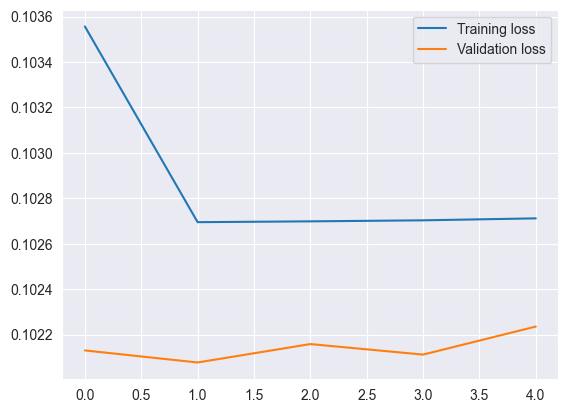

In [87]:
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend();

Reconstruction error threshold: 0.3284798883115905


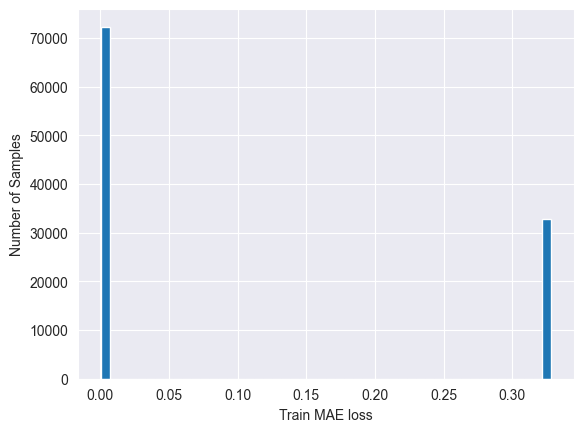

In [88]:
X_train_pred = model.predict(X_train, verbose=0)
train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel('Train MAE loss')
plt.ylabel('Number of Samples')

threshold = np.max(train_mae_loss)
print(f'Reconstruction error threshold: {threshold}')

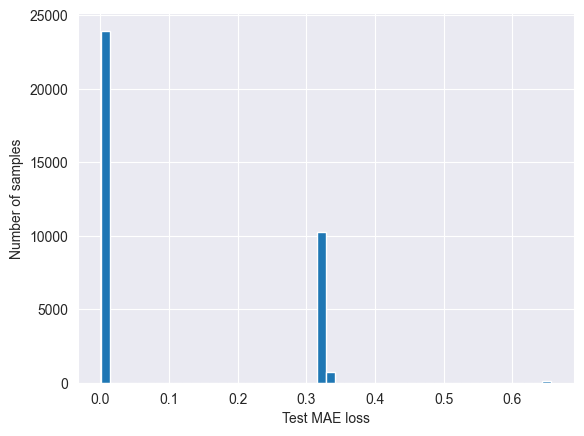

In [89]:
X_test_pred = model.predict(X_test, verbose=0)
test_mae_loss = np.mean(np.abs(X_test_pred-X_test), axis=1)

plt.hist(test_mae_loss, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of samples');

In [90]:
test_score_df = pd.DataFrame(test[TIME_STEPS:])
test_score_df['loss'] = test_mae_loss
test_score_df['threshold'] = threshold
test_score_df['anomaly'] = test_score_df['loss'] > test_score_df['threshold']
test_score_df['y'] = test[TIME_STEPS:]['y']

In [91]:
test_score_df.head()

,ds,y,loss,threshold,anomaly
30,2018-01-01 07:45:00,-0.102598,0.32848,0.32848,False
31,2018-01-01 08:00:00,-0.102598,0.32848,0.32848,False
32,2018-01-01 08:15:00,-0.102598,0.32848,0.32848,False
33,2018-01-01 08:30:00,-0.102598,0.32848,0.32848,False
34,2018-01-01 08:45:00,-0.102598,0.32848,0.32848,False


In [92]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['ds'], y=test_score_df['loss'], name='Test loss'))
fig.add_trace(go.Scatter(x=test_score_df['ds'], y=test_score_df['threshold'], name='Threshold'))
fig.update_layout(showlegend=True, title='Test loss vs. Threshold')
fig.show()

In [93]:
anomalies = test_score_df.loc[test_score_df['anomaly'] == True]
anomalies

,ds,y,loss,threshold,anomaly
64,2018-01-01 16:15:00,-0.102598,0.656779,0.32848,True
65,2018-01-01 16:30:00,-0.102598,0.656781,0.32848,True
66,2018-01-01 16:45:00,-0.102598,0.656781,0.32848,True
67,2018-01-01 17:00:00,-0.102598,0.656781,0.32848,True
68,2018-01-01 17:15:00,-0.102598,0.656781,0.32848,True
...,...,...,...,...,...
341,2018-01-04 13:30:00,-0.102598,0.656781,0.32848,True
342,2018-01-04 13:45:00,-0.102598,0.656781,0.32848,True
343,2018-01-04 14:00:00,-0.102598,0.656781,0.32848,True
344,2018-01-04 14:15:00,-0.102598,0.656781,0.32848,True


In [94]:
anomalies.shape

(85, 5)

In [95]:
previous_login=0
previous_date=''
# print(test_score_df)

def frequency(df):
    time_list={}
    df['ds']





for index, row in test_score_df.iterrows():

#     print(index)
    if row['anomaly'] == True and round(previous_login) == 10:
#         print(test_score_df[index+1:index+672])
        print(previous_date,"->1")
    elif row['anomaly'] == True and round(row['y']) == 10:
        print(row['ds'],"->2")
    else:
        pass
    previous_login=row['y']
    previous_date=row['ds']


2018-01-01 16:00:00 ->1
2018-01-02 08:15:00 ->1
2018-01-02 14:30:00 ->2
2018-01-02 14:30:00 ->1
2018-01-02 20:30:00 ->1
2018-01-04 09:00:00 ->1
